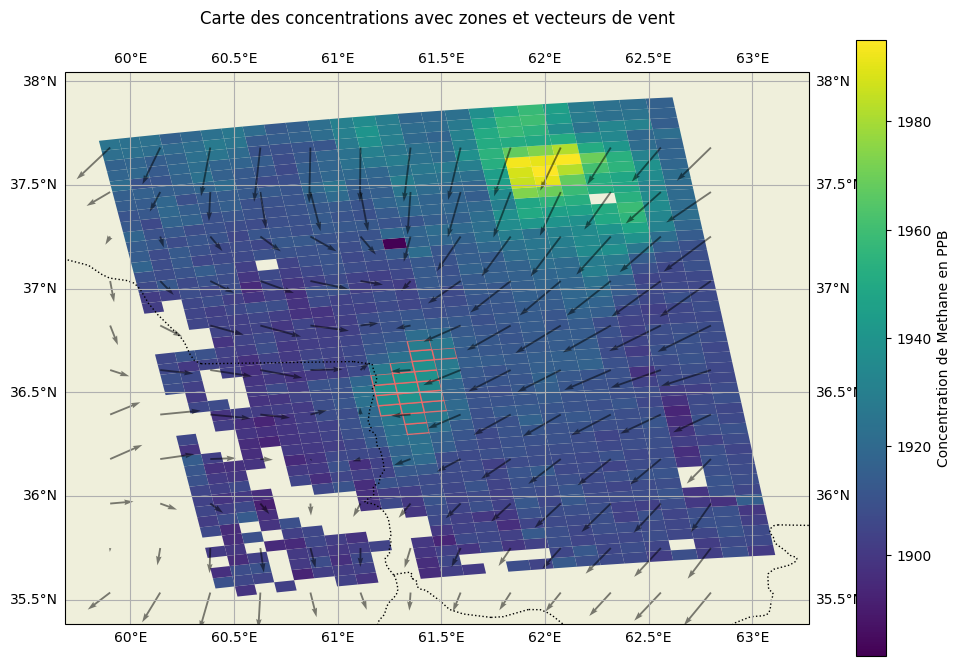

emissions totales= 23.142791389769656 tonnes par heures
latlon= (36.73, 61.5)


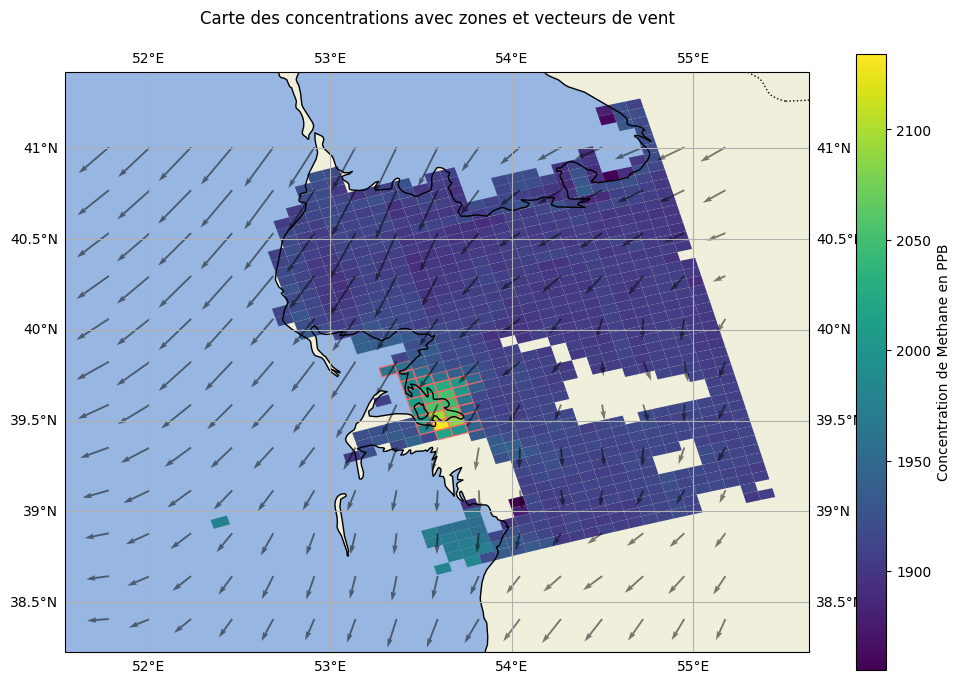

emissions totales= 261.55610144067043 tonnes par heures
latlon= (39.8, 53.4)


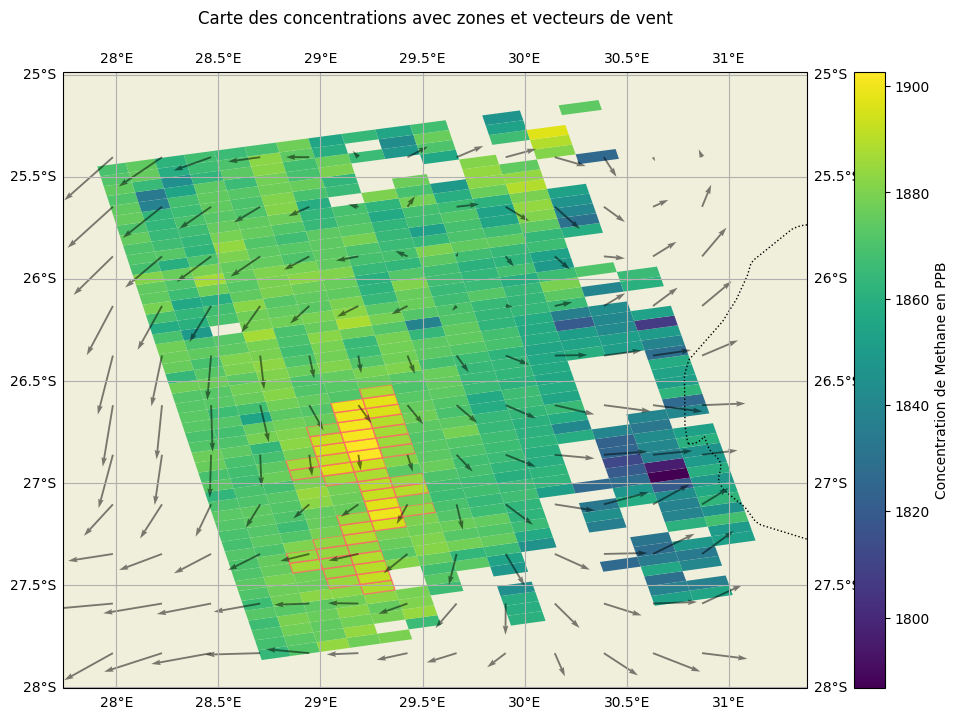

emissions totales= 42.03602486983205 tonnes par heures
latlon= (-26.6, 29.29)


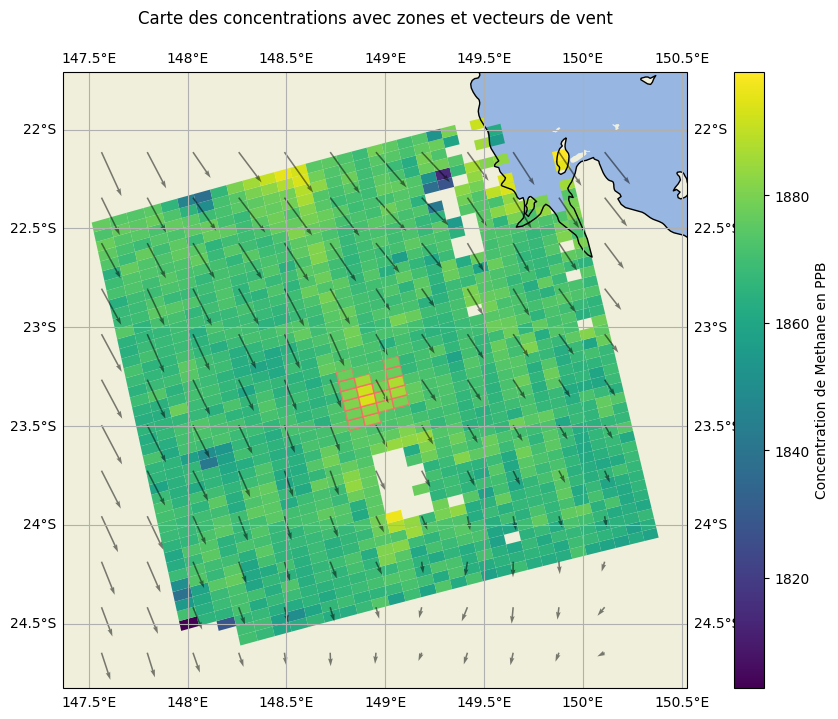

emissions totales= 22.06167433068674 tonnes par heures
latlon= (-23.27, 148.89)


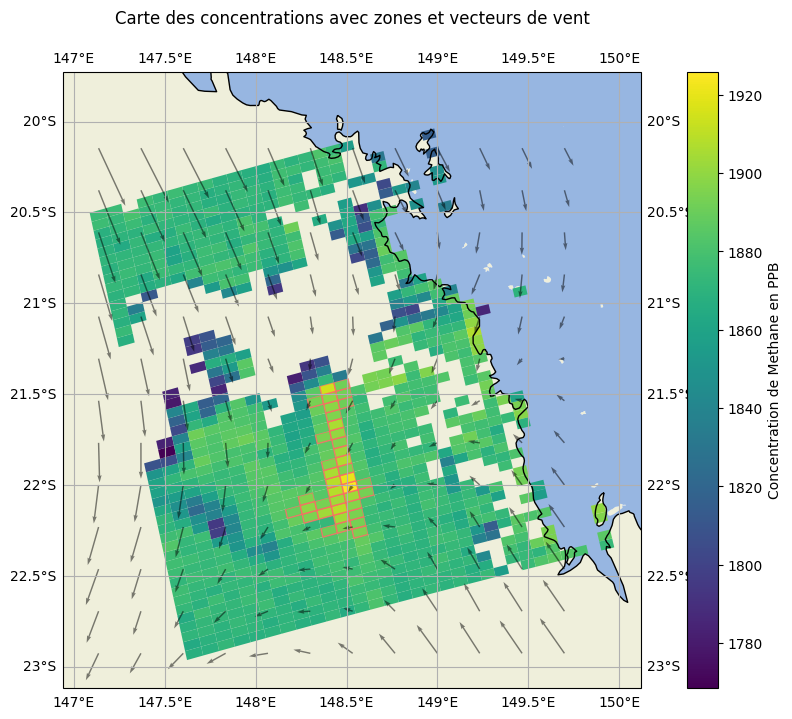

emissions totales= 48.82459667914172 tonnes par heures
latlon= (-21.52, 148.41)


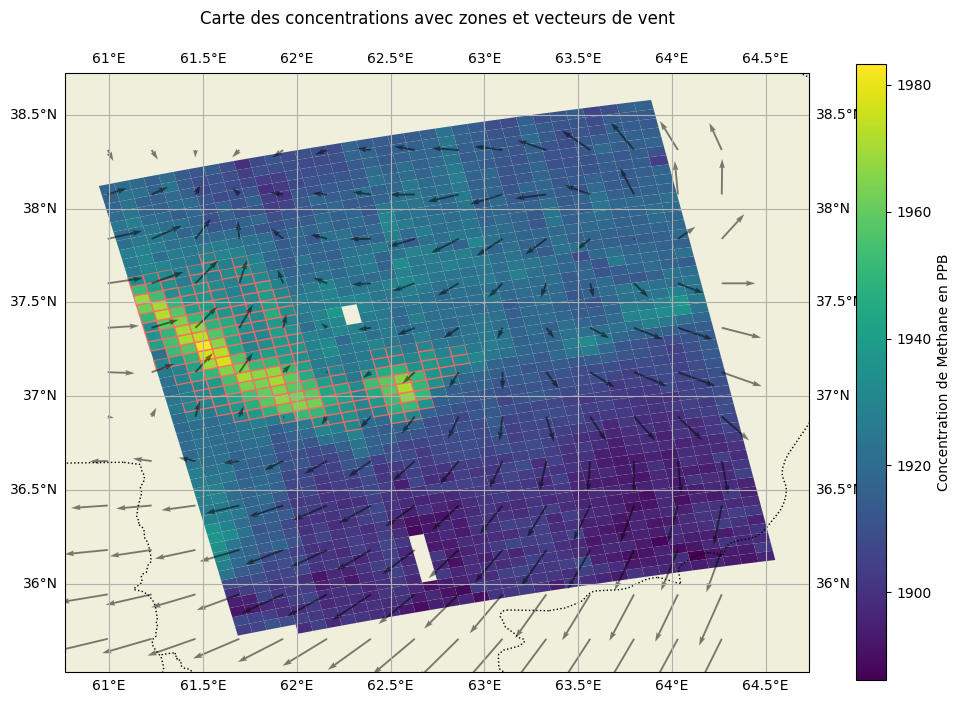

emissions totales= 123.67550555289695 tonnes par heures
latlon= (37.22, 62.7)


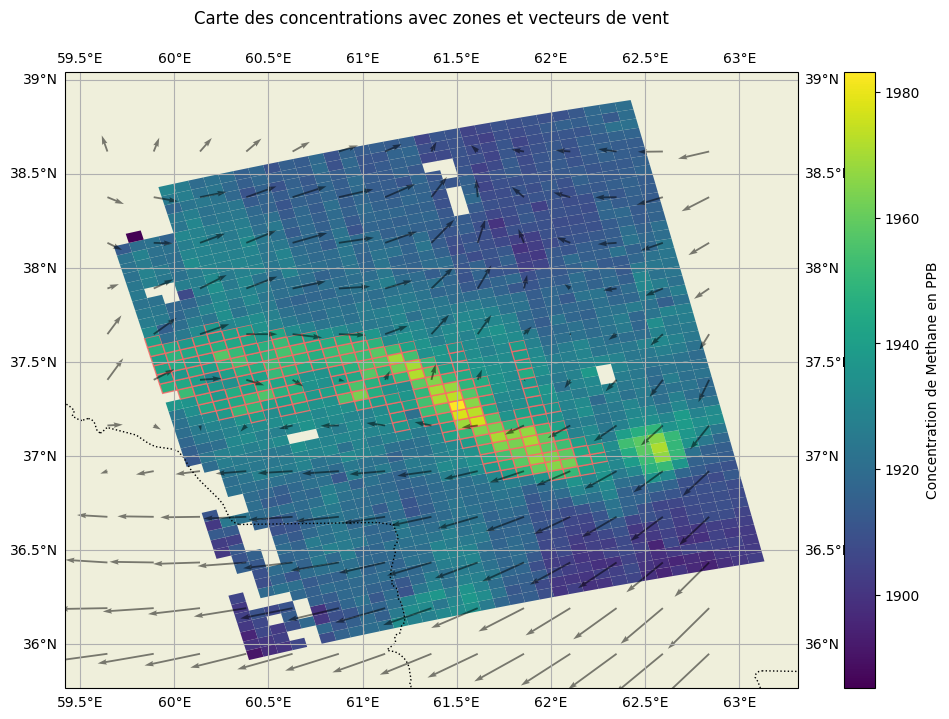

emissions totales= 116.49586004021661 tonnes par heures
latlon= (37.5, 61.35)


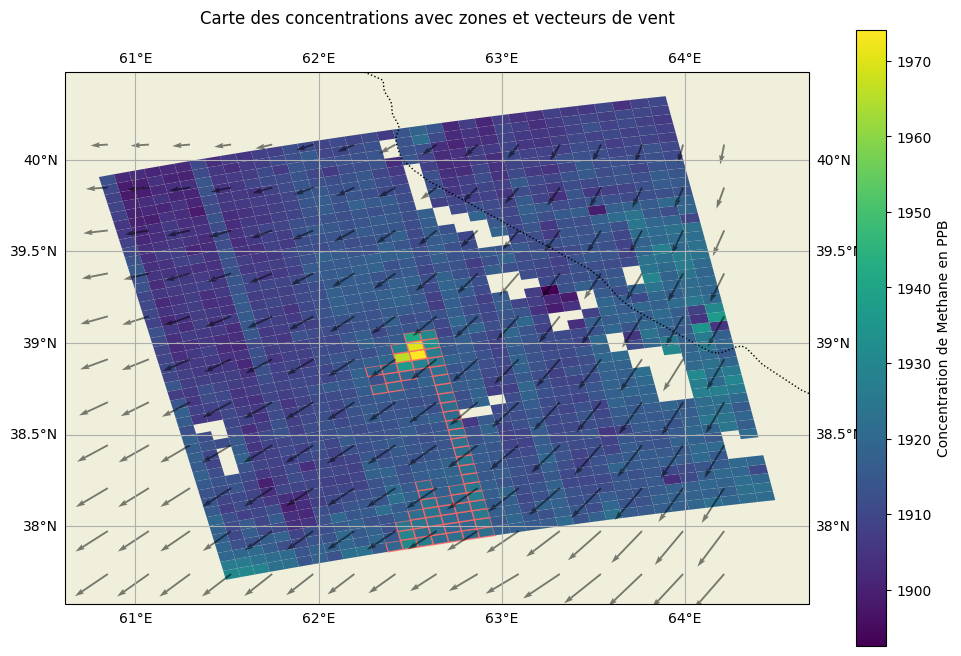

emissions totales= 59.03049203571582 tonnes par heures
latlon= (39.05, 62.6)


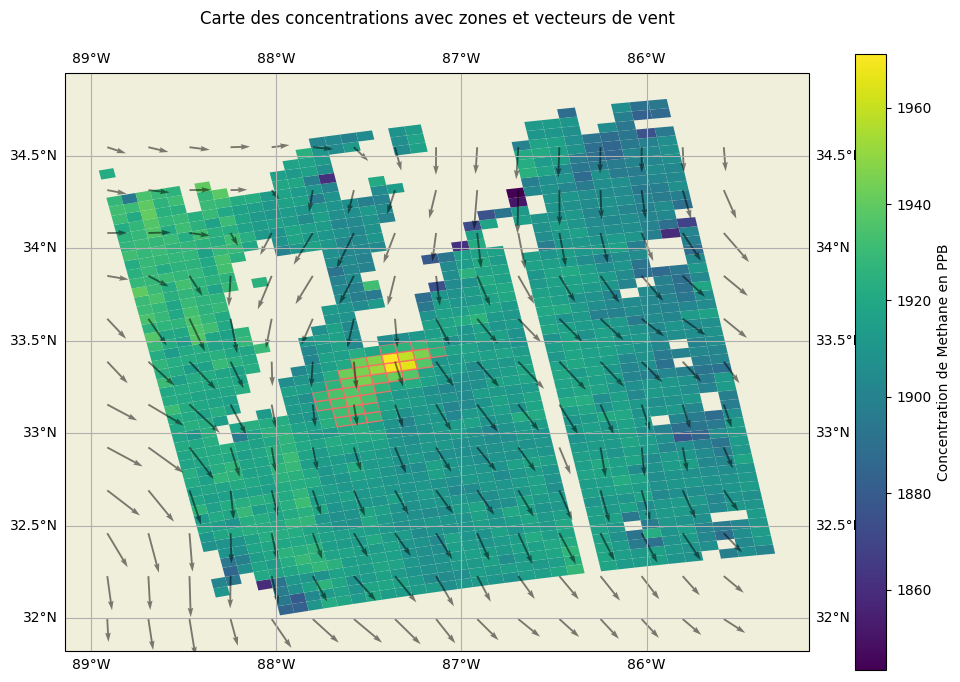

emissions totales= 32.36582003720214 tonnes par heures
latlon= (33.43, -87.21)


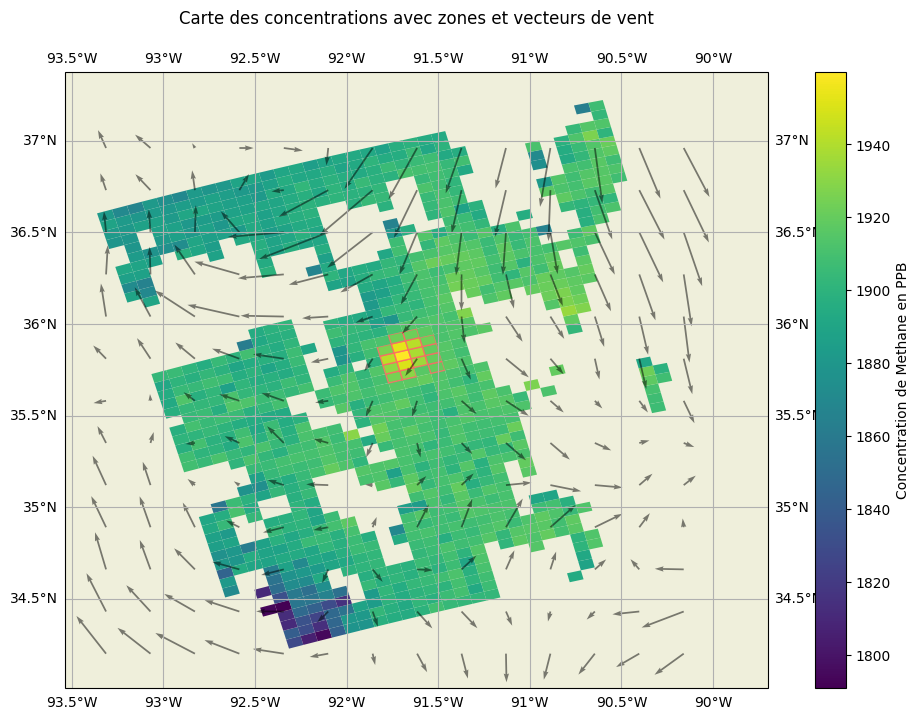

emissions totales= 19.98800124359269 tonnes par heures
latlon= (35.71, -91.74)


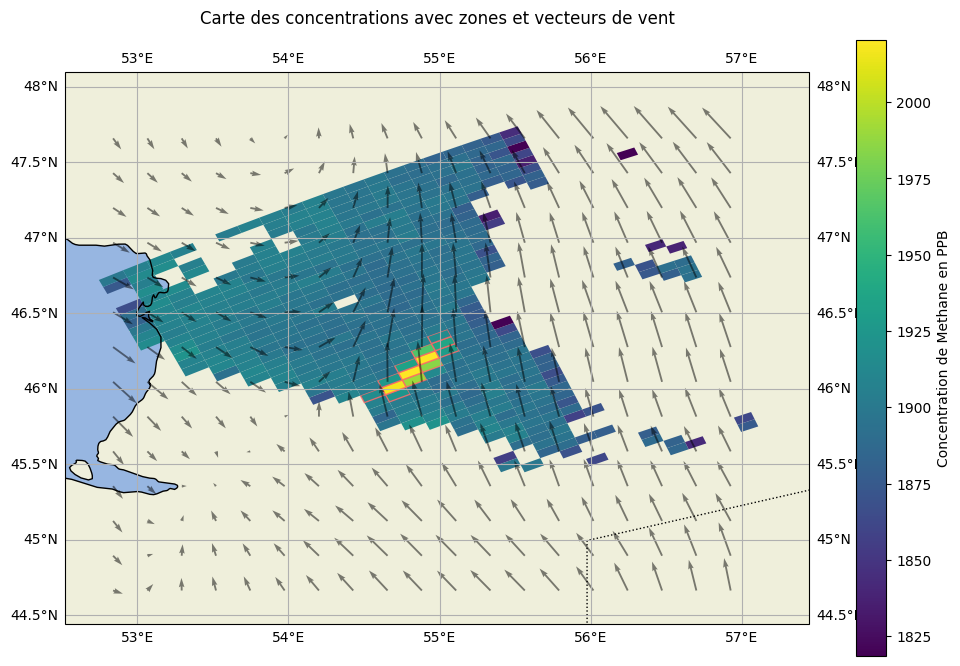

emissions totales= 135.55796864692846 tonnes par heures
latlon= (46.25, 54.89)


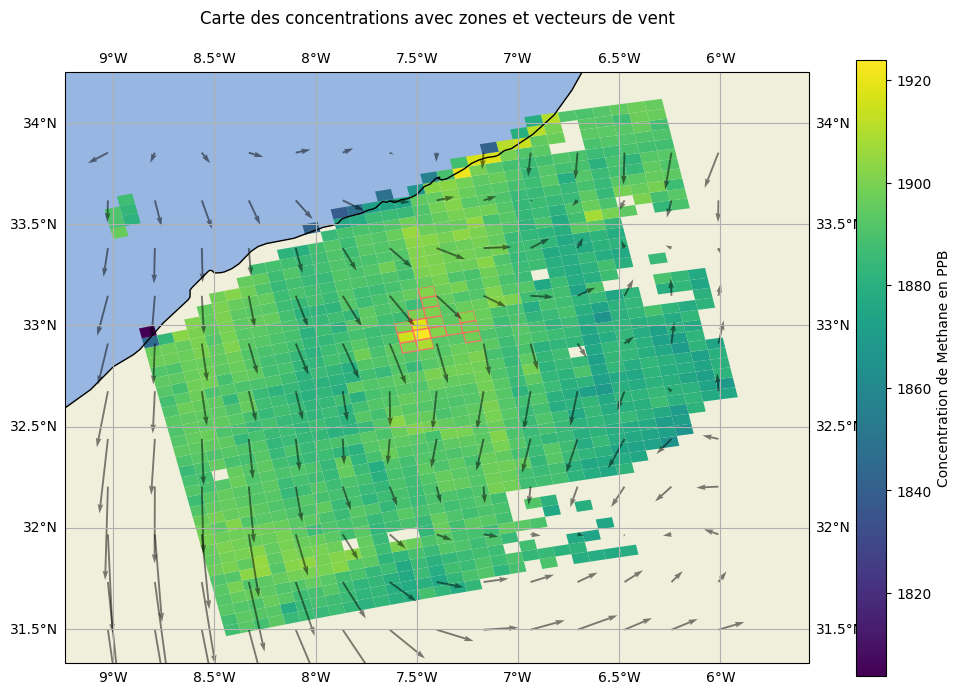

emissions totales= 13.978135642894344 tonnes par heures
latlon= (33.01, -7.49)


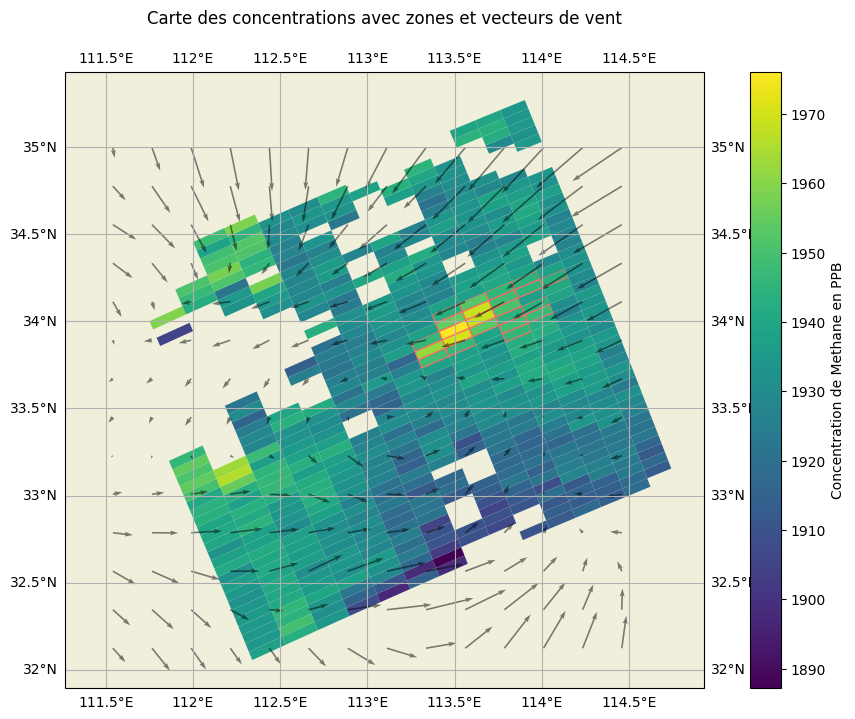

emissions totales= 33.81192429071737 tonnes par heures
latlon= (33.79, 113.38)


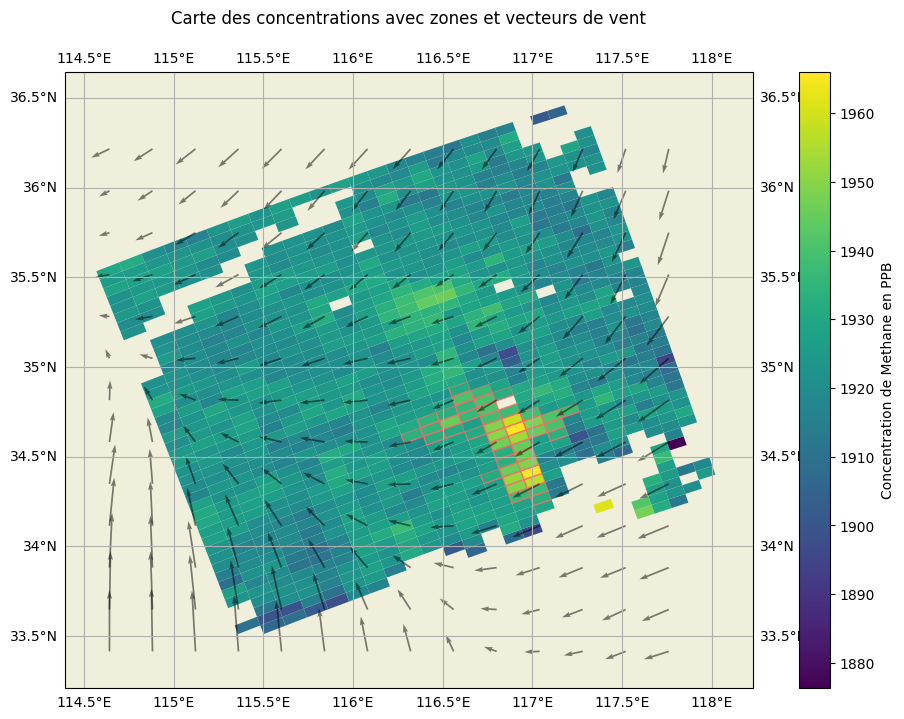

emissions totales= 41.35411177516286 tonnes par heures
latlon= (34.83, 116.61)


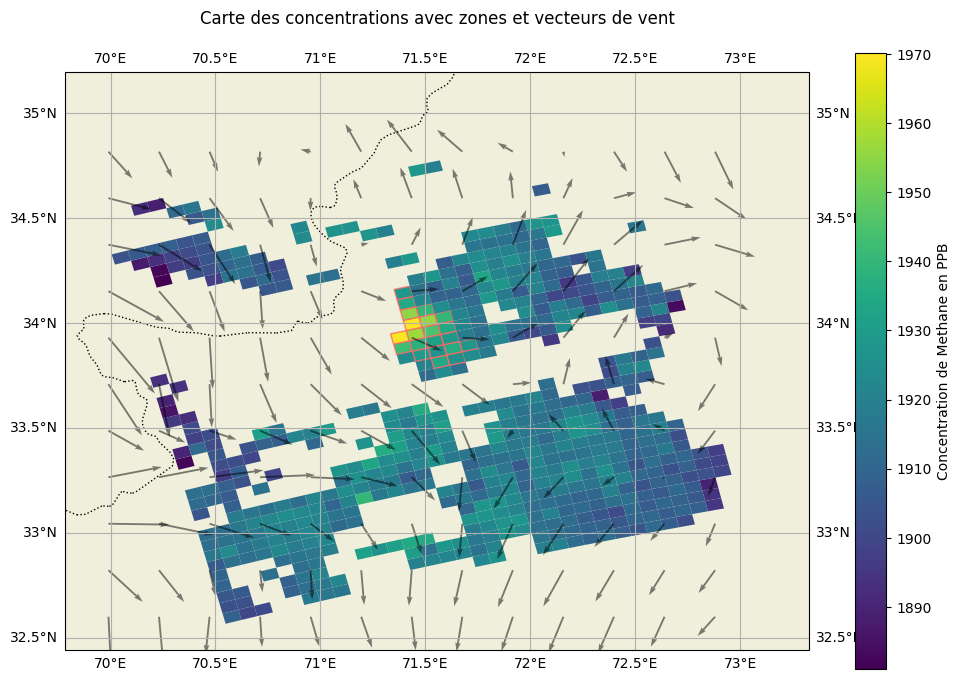

emissions totales= 17.877171275589085 tonnes par heures
latlon= (34.03, 71.59)


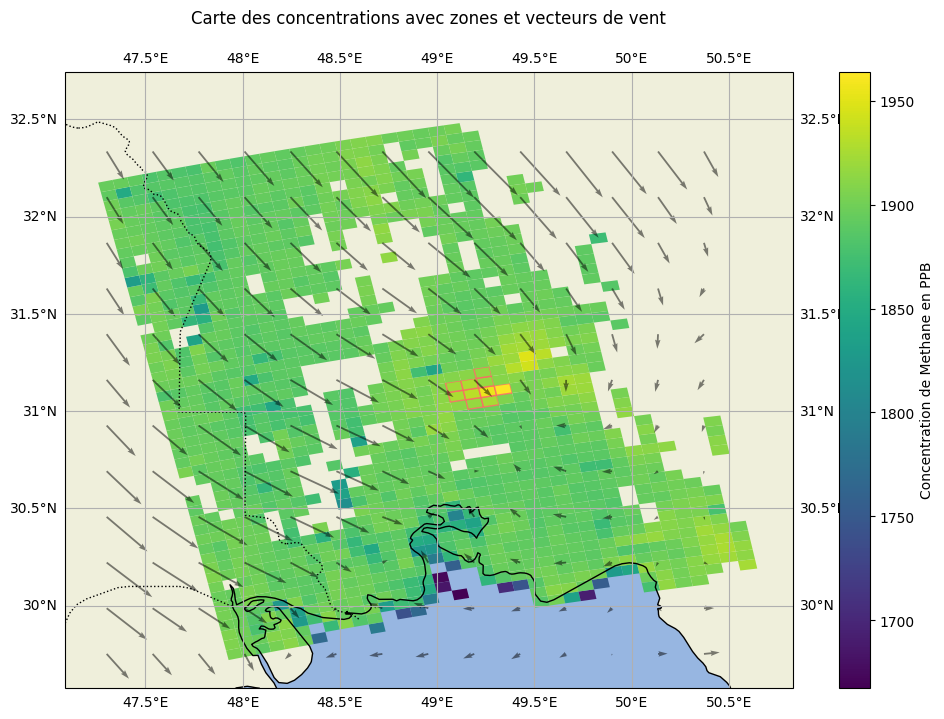

emissions totales= 66.76491759445739 tonnes par heures
latlon= (31.13, 49.09)


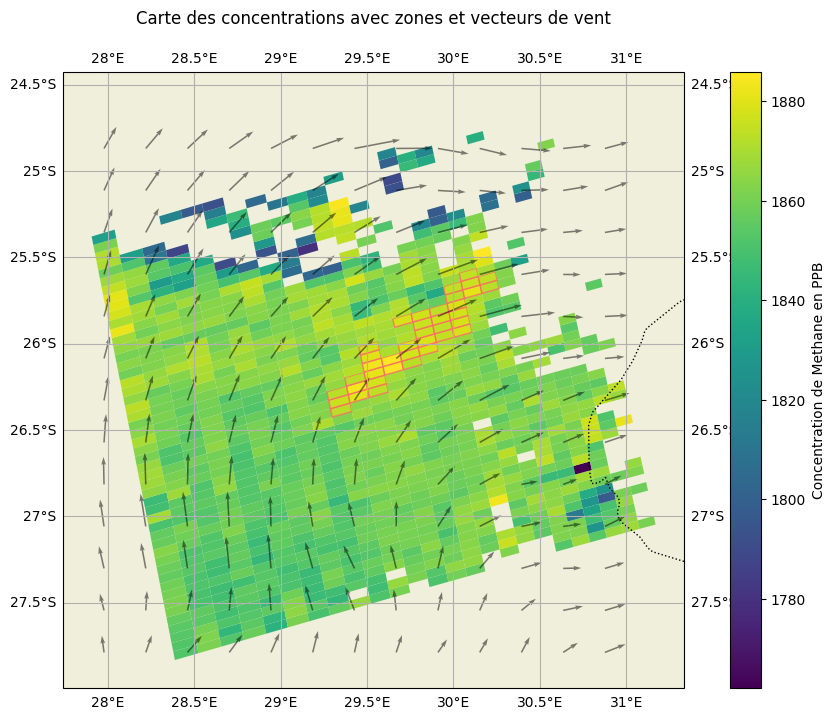

emissions totales= 51.72099599593435 tonnes par heures
latlon= (-26.3, 29.45)


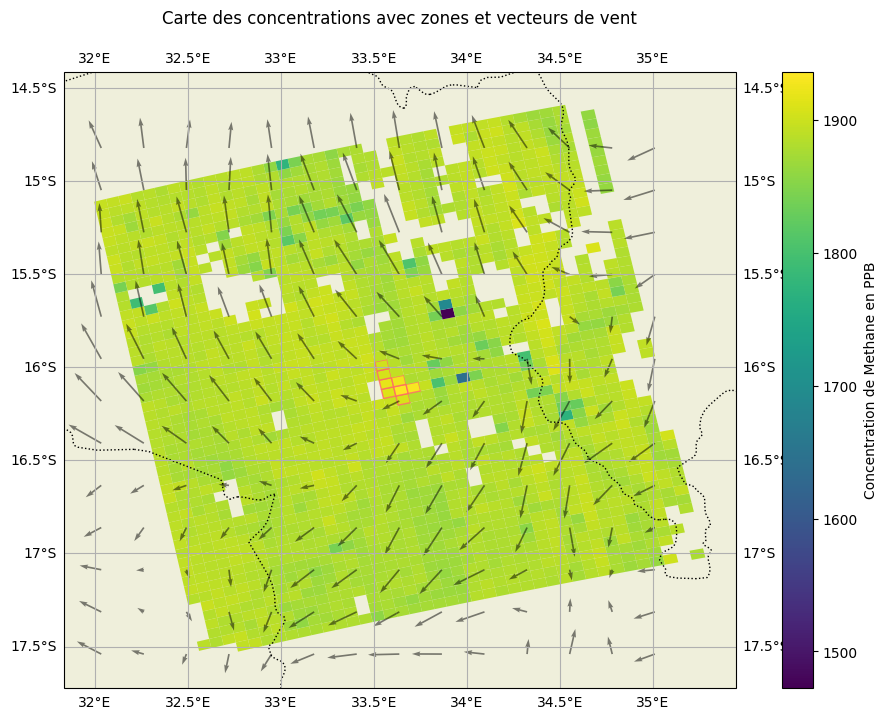

emissions totales= 26.864122279124256 tonnes par heures
latlon= (-16.12, 33.65)


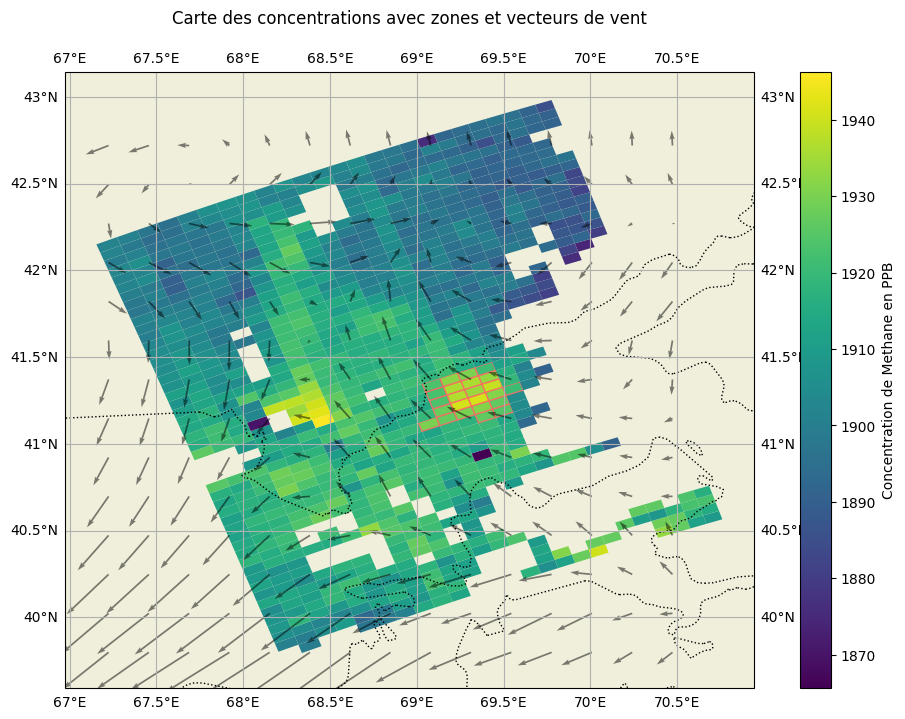

emissions totales= 38.496229626933165 tonnes par heures
latlon= (41.37, 69.19)


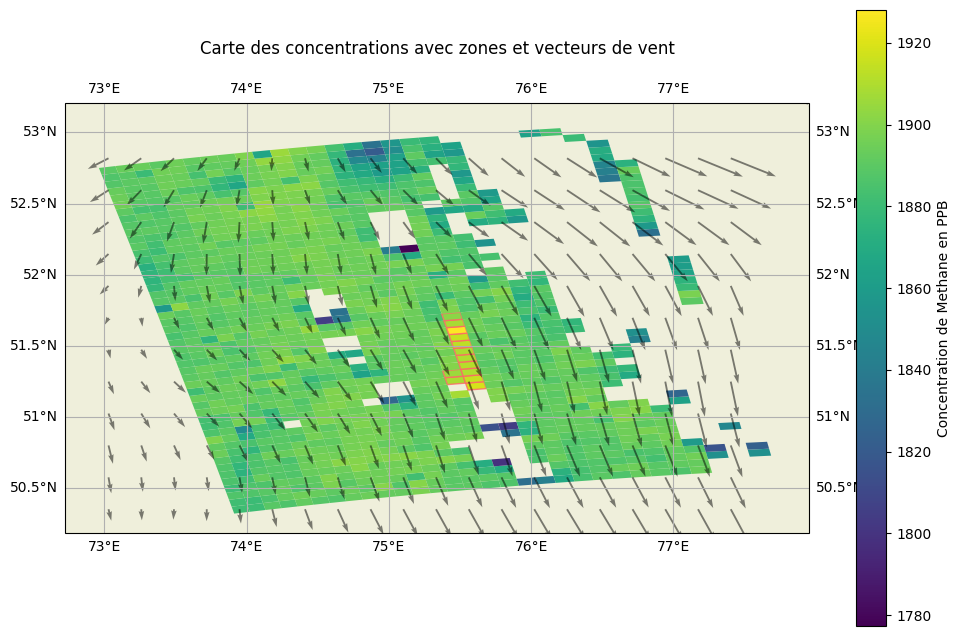

emissions totales= 27.305220220968494 tonnes par heures
latlon= (51.66, 75.46)


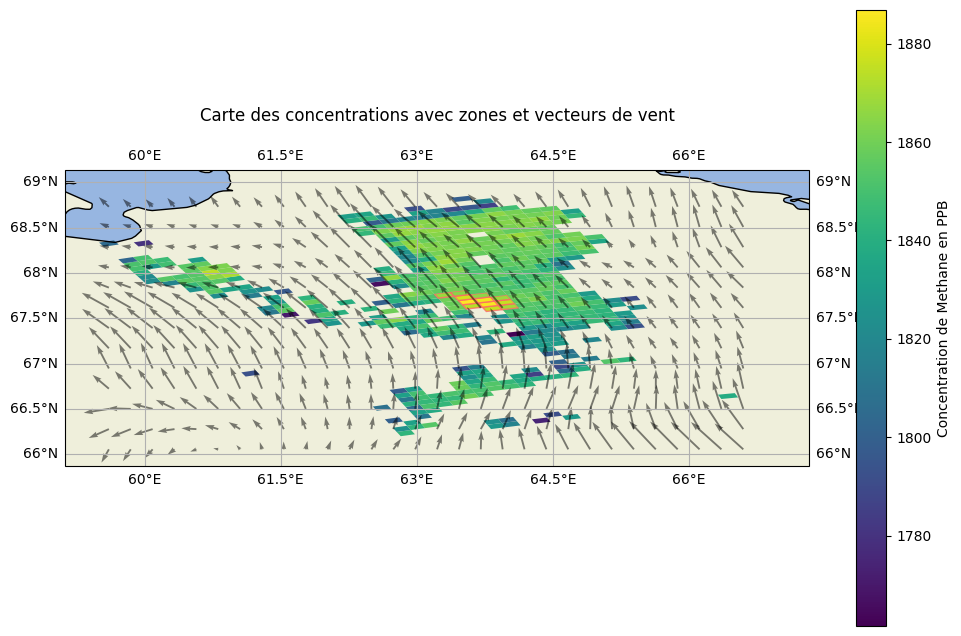

emissions totales= 27.372490817303206 tonnes par heures
latlon= (67.61, 63.83)


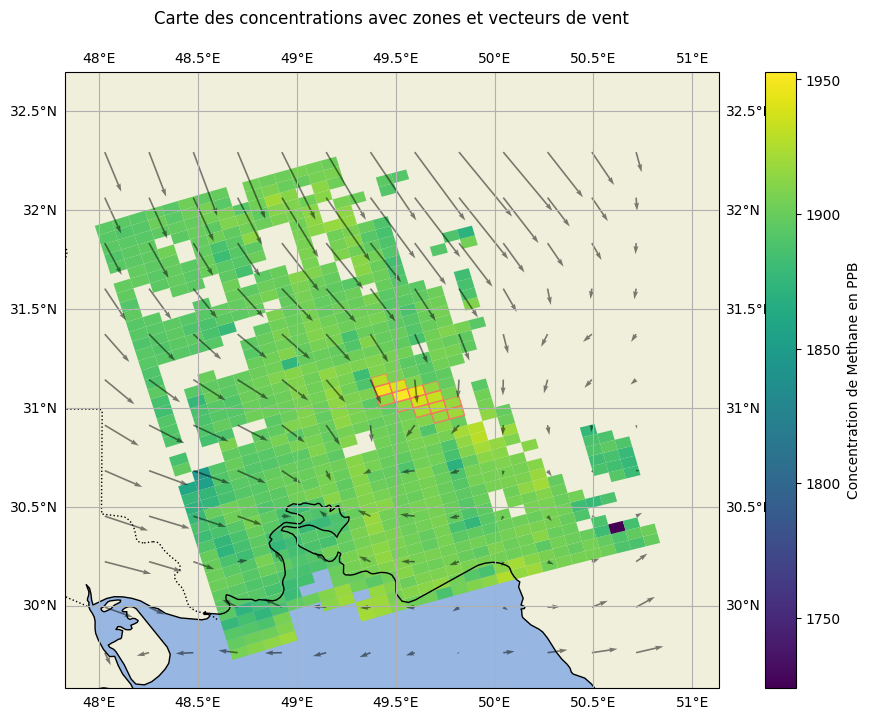

emissions totales= 47.46669890225689 tonnes par heures
latlon= (31.14, 49.42)


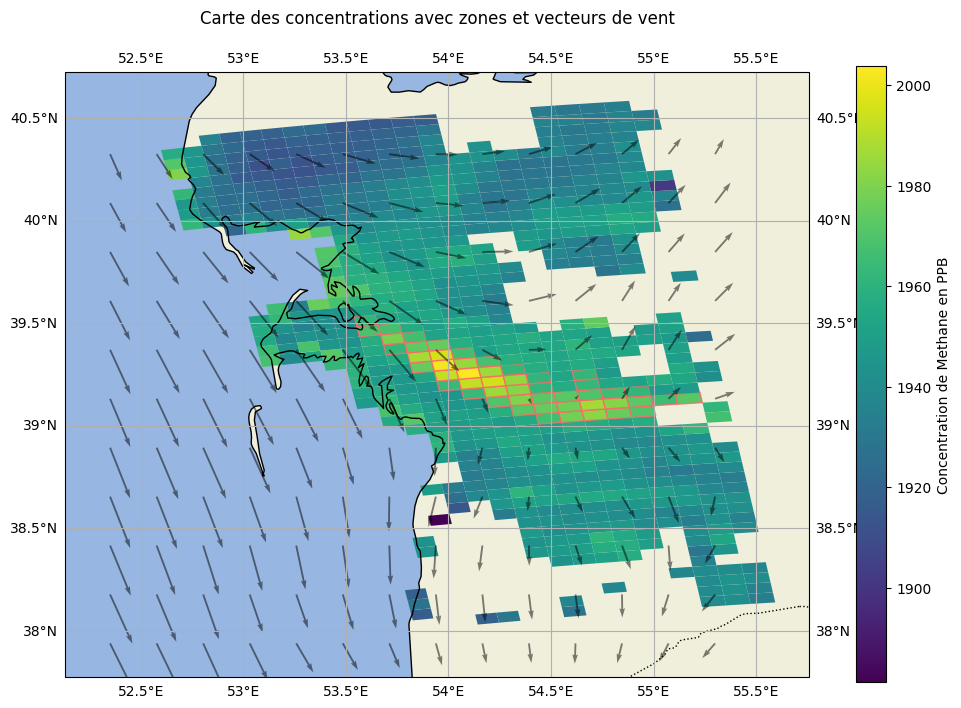

emissions totales= 151.590239722542 tonnes par heures
latlon= (39.34, 53.86)


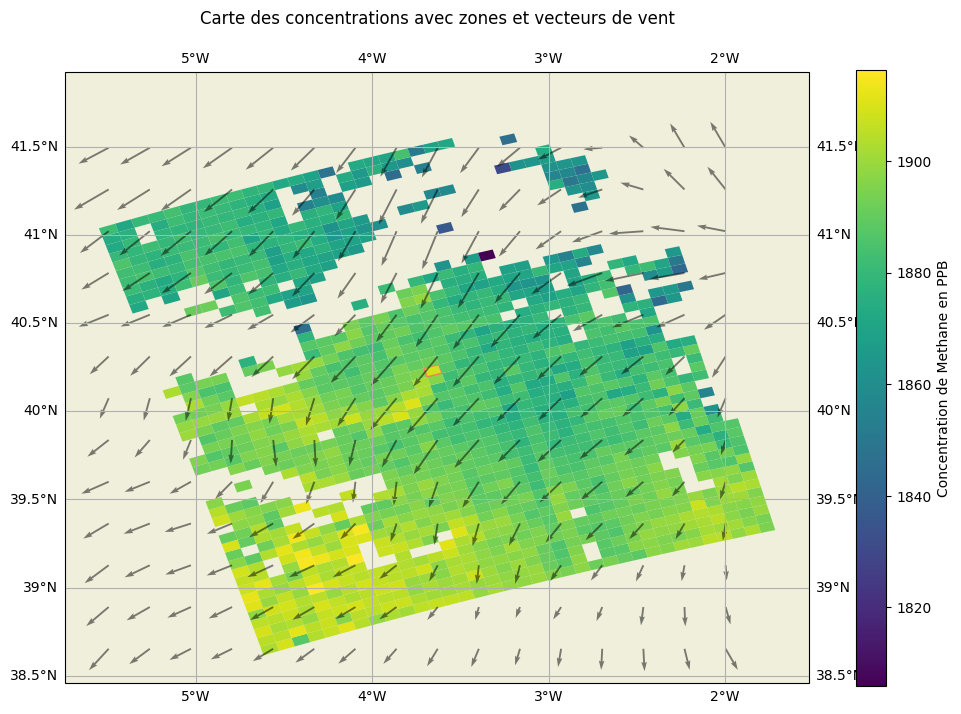

emissions totales= 6.495383559072405 tonnes par heures
latlon= (40.23, -3.66)


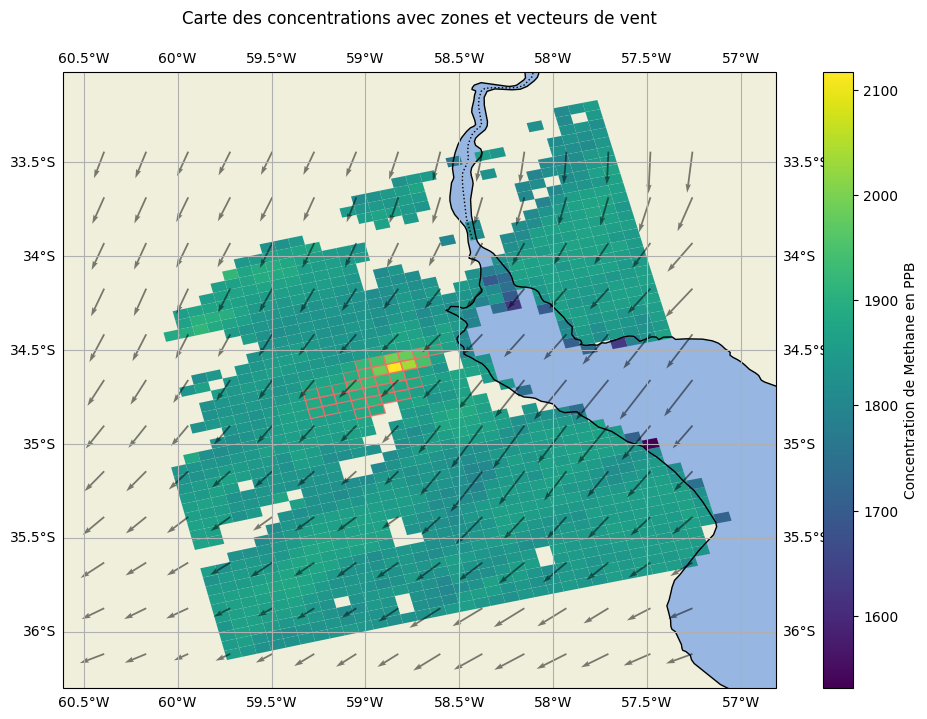

emissions totales= 149.01338107738627 tonnes par heures
latlon= (-34.58, -58.77)


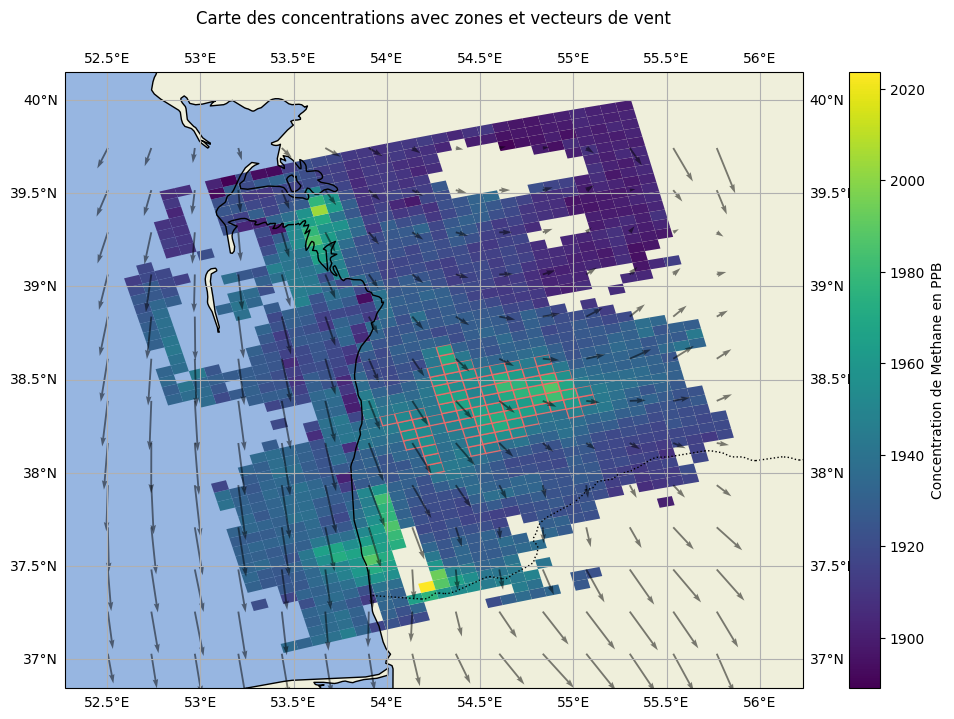

emissions totales= 135.07308098203708 tonnes par heures
latlon= (38.45, 54.3)


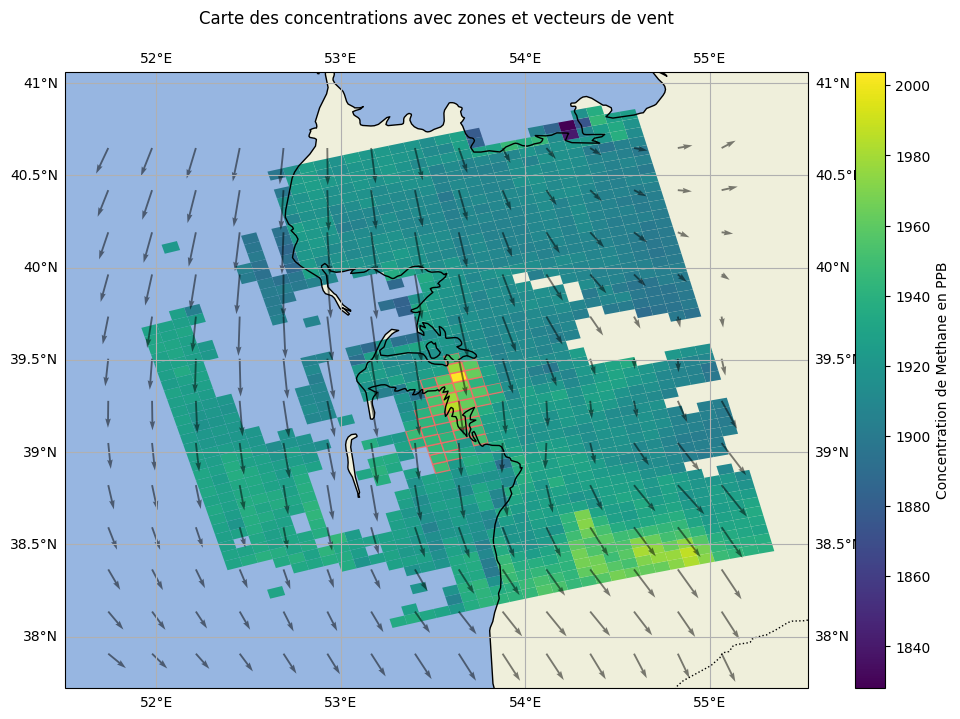

emissions totales= 112.67140194628135 tonnes par heures
latlon= (39.51, 53.61)


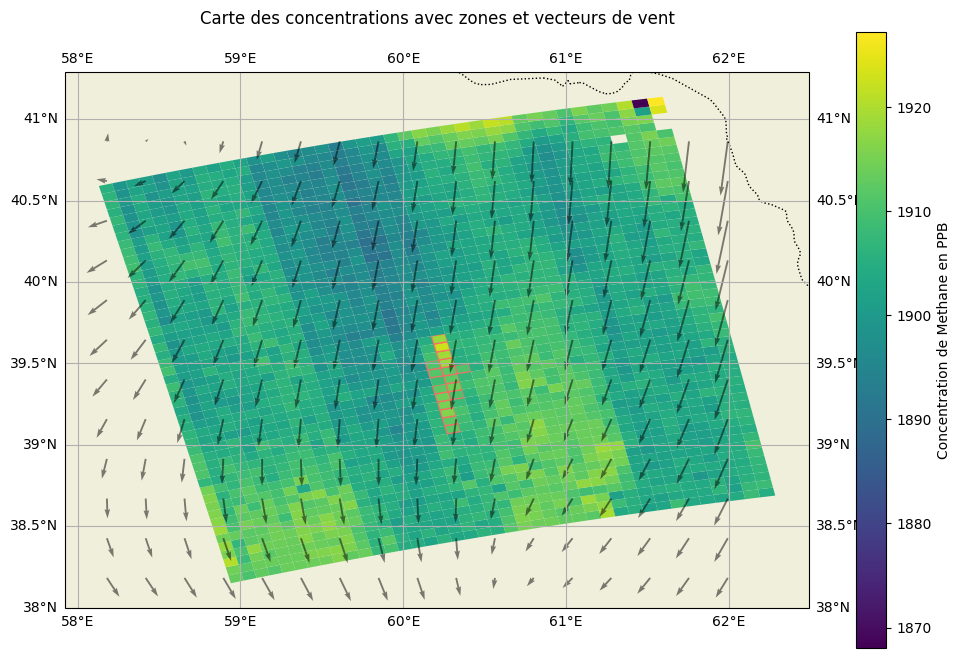

emissions totales= 14.233569393247334 tonnes par heures
latlon= (39.65, 60.22)


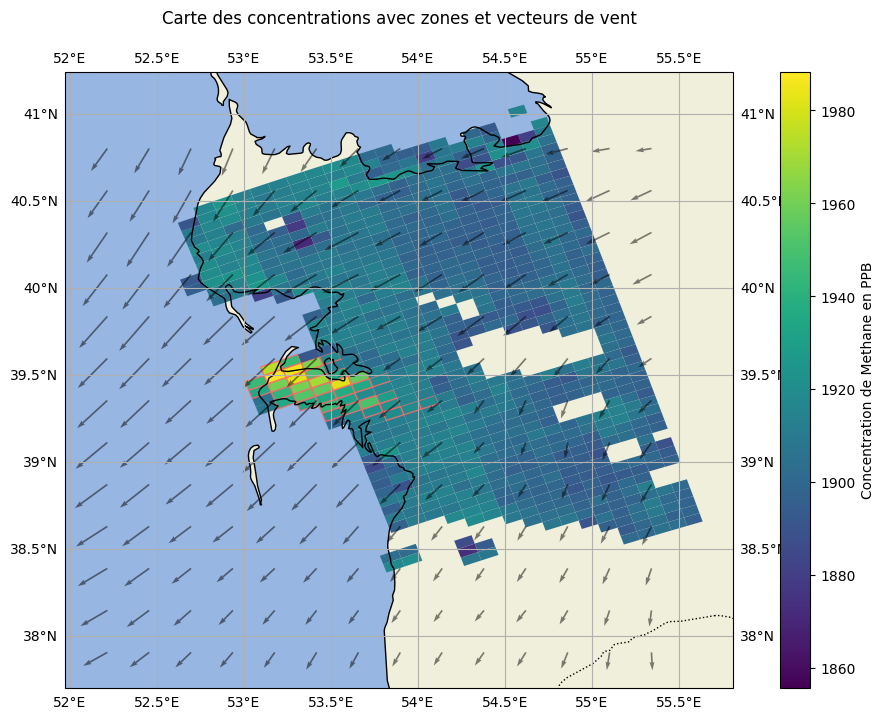

emissions totales= 152.20403089880173 tonnes par heures
latlon= (39.38, 53.82)


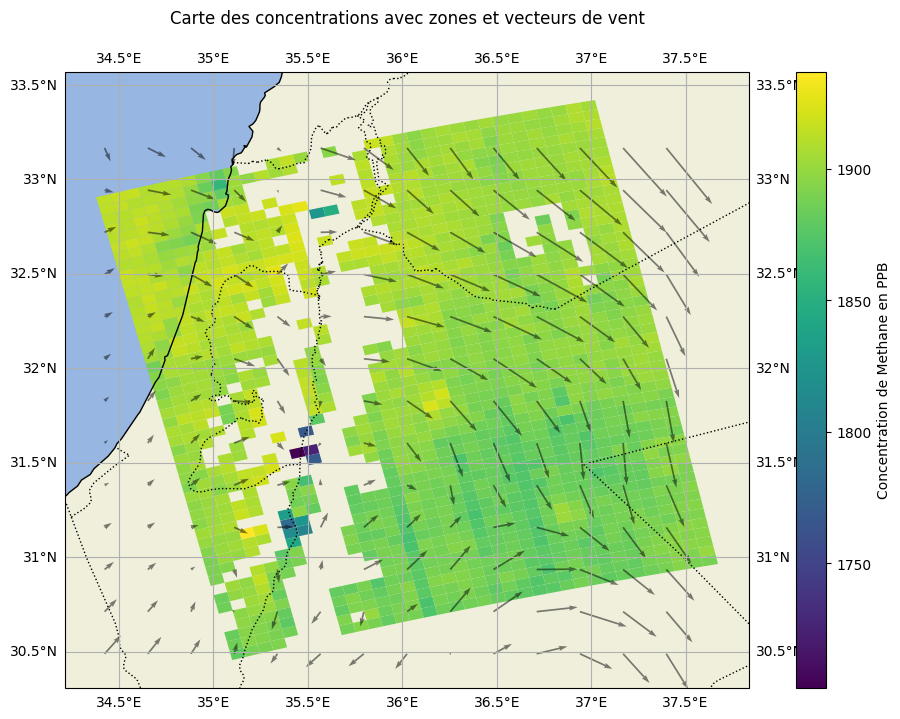

C:\Users\lilia\AppData\Local\Temp\ipykernel_24644\3334626952.py:289: RuntimeWarning: invalid value encountered in scalar divide
  IME=IME/np.sqrt(total_area)


emissions totales= nan tonnes par heures
latlon= (32.03, 36.01)


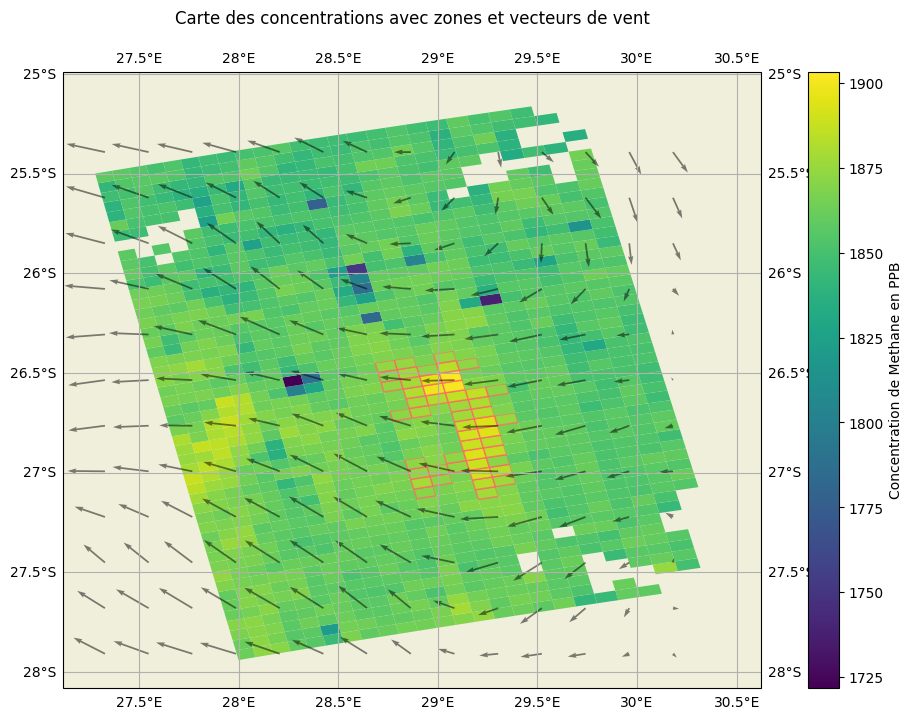

emissions totales= 56.6037217883894 tonnes par heures
latlon= (-26.47, 29.05)


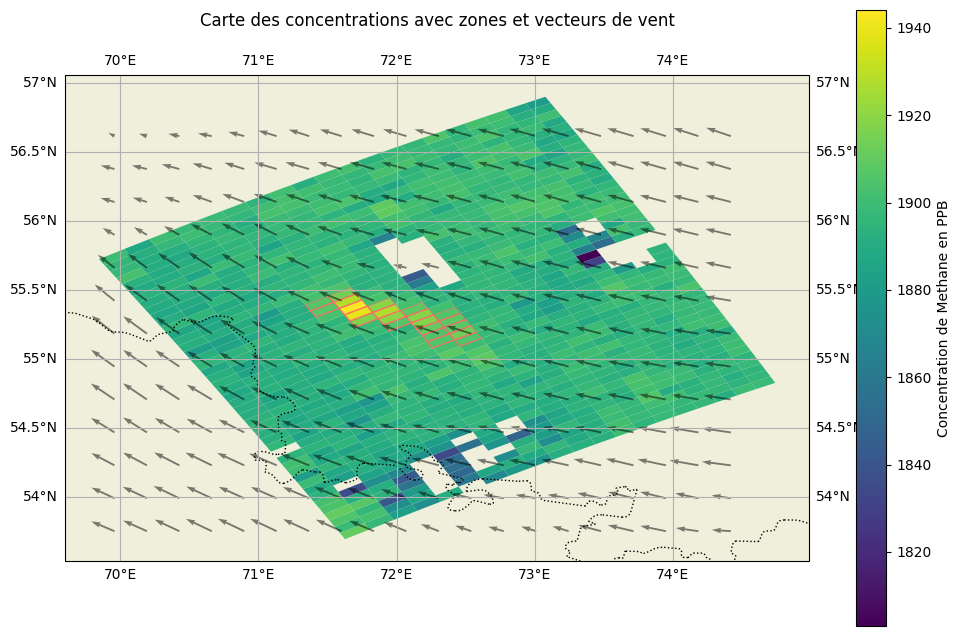

emissions totales= 66.12583377019183 tonnes par heures
latlon= (55.23, 72.24)


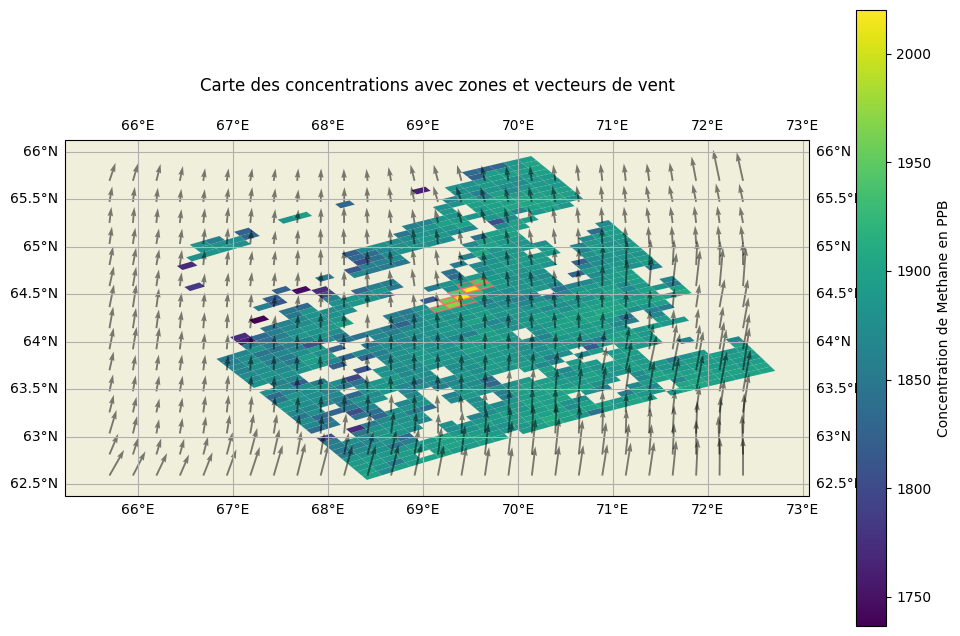

emissions totales= 61.778016792440084 tonnes par heures
latlon= (64.35, 69.17)


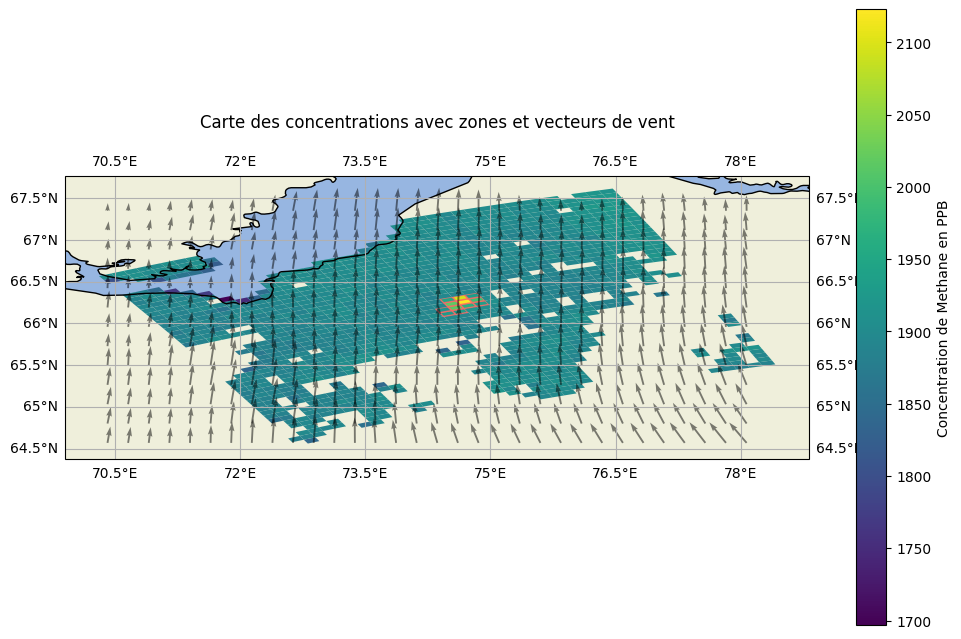

emissions totales= 161.62194705001212 tonnes par heures
latlon= (66.12, 74.49)


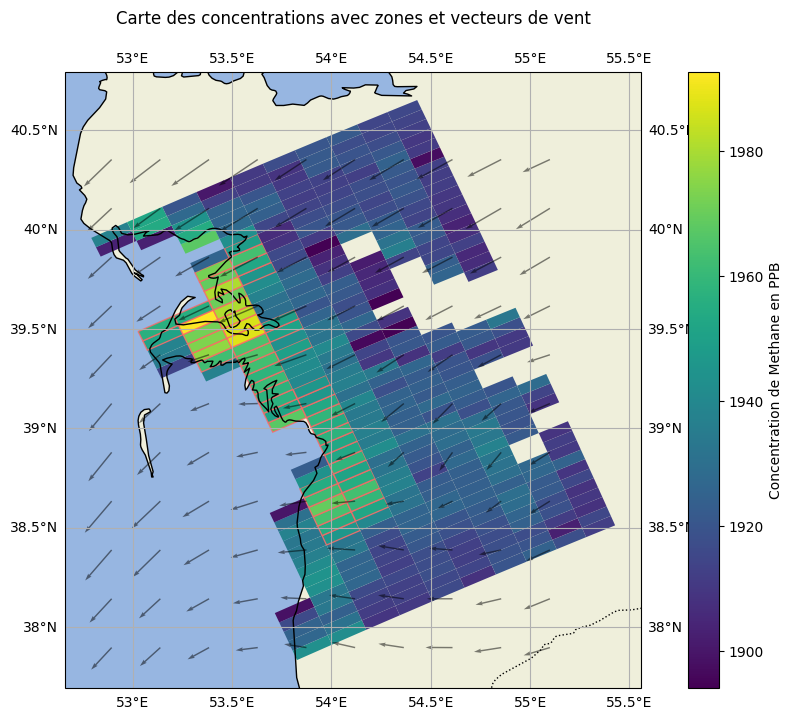

emissions totales= 205.99899055909373 tonnes par heures
latlon= (39.16, 53.92)


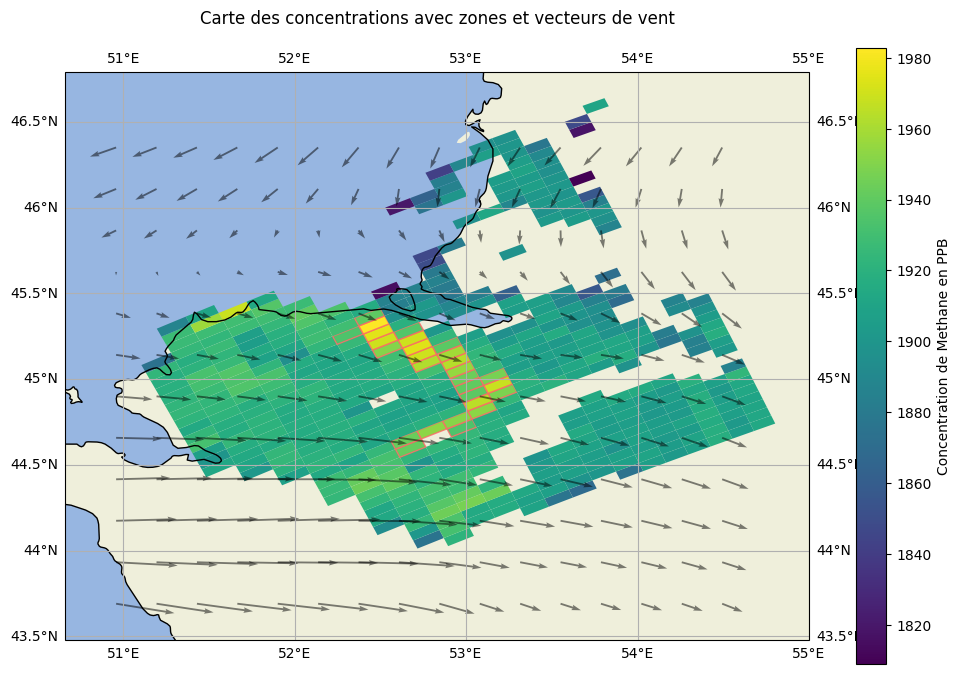

emissions totales= 126.05833602100974 tonnes par heures
latlon= (45.19, 52.72)


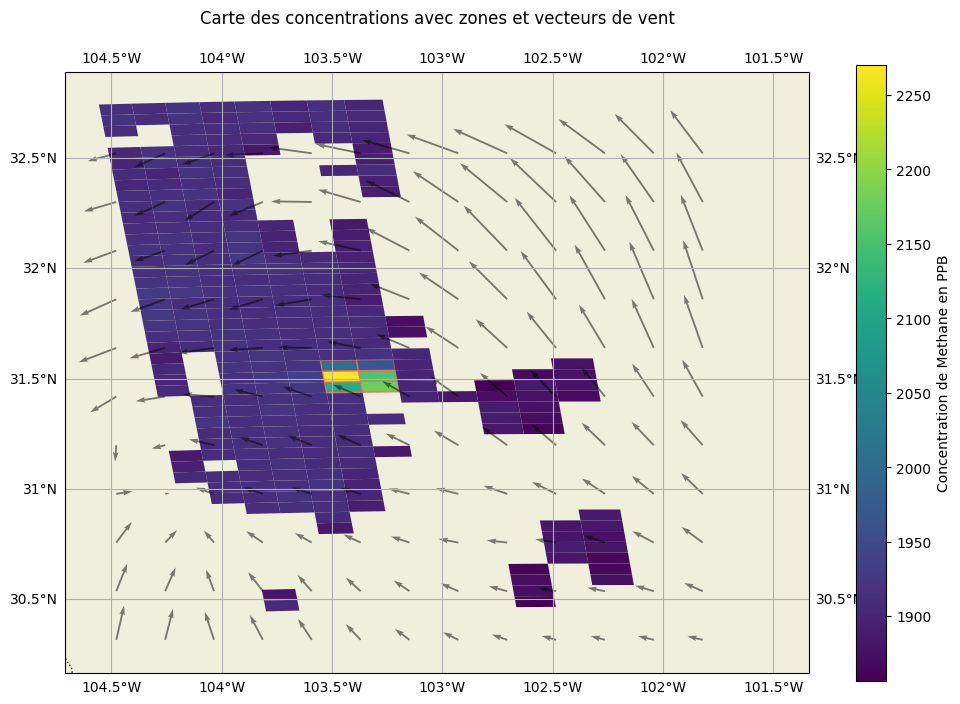

emissions totales= 371.47573339514435 tonnes par heures
latlon= (31.46, -103.28)


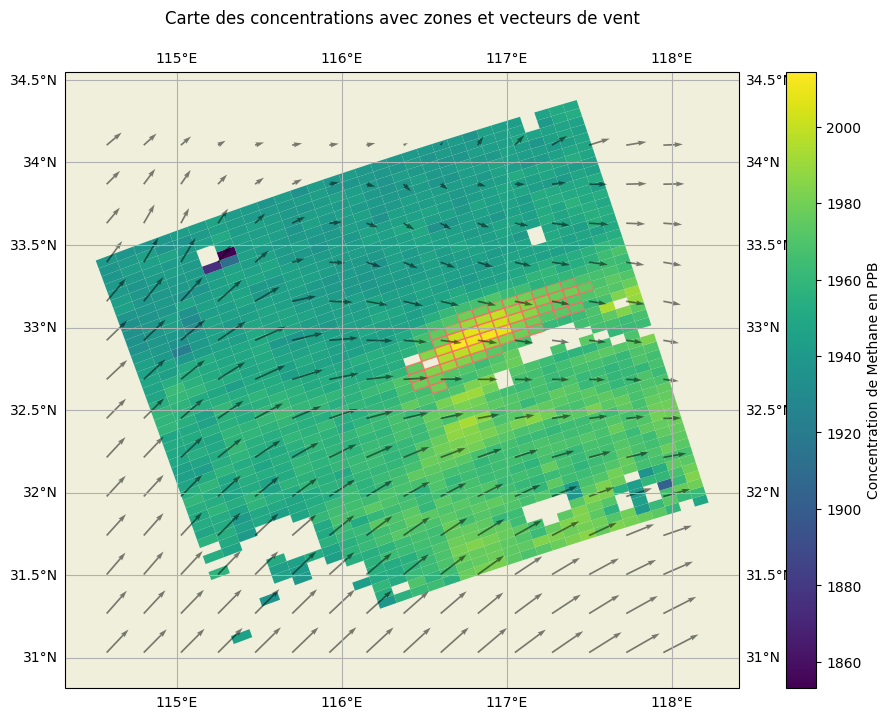

emissions totales= 108.93384472754418 tonnes par heures
latlon= (32.66, 116.48)


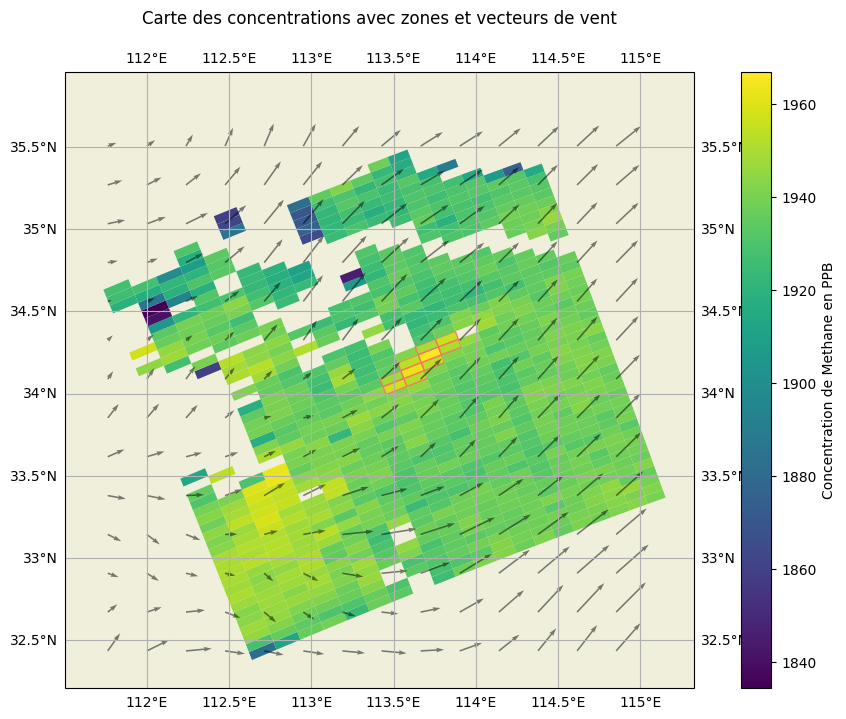

emissions totales= 35.6422860375379 tonnes par heures
latlon= (34.04, 113.51)


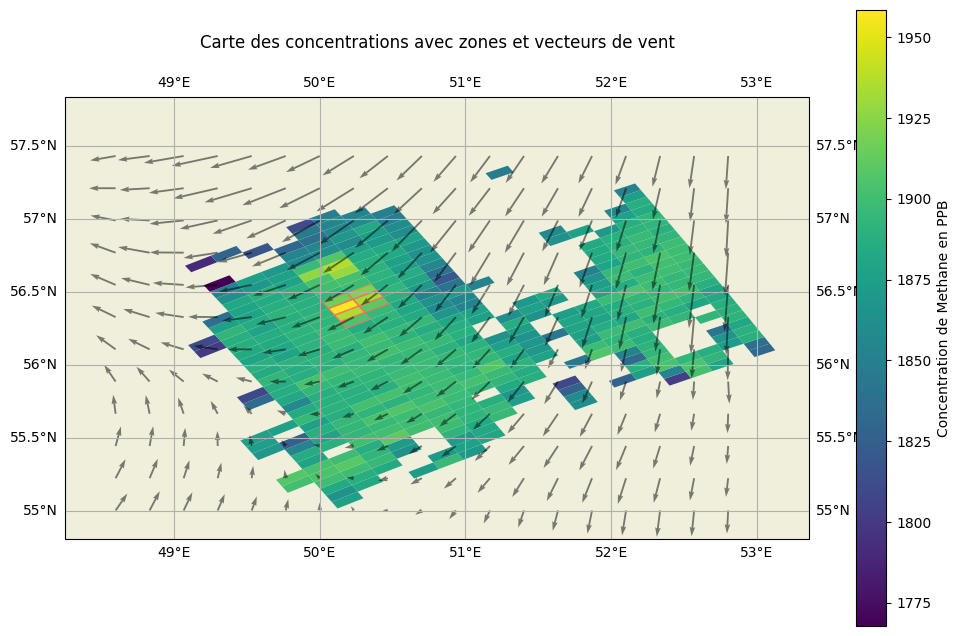

emissions totales= 38.01680810259015 tonnes par heures
latlon= (56.5, 50.29)


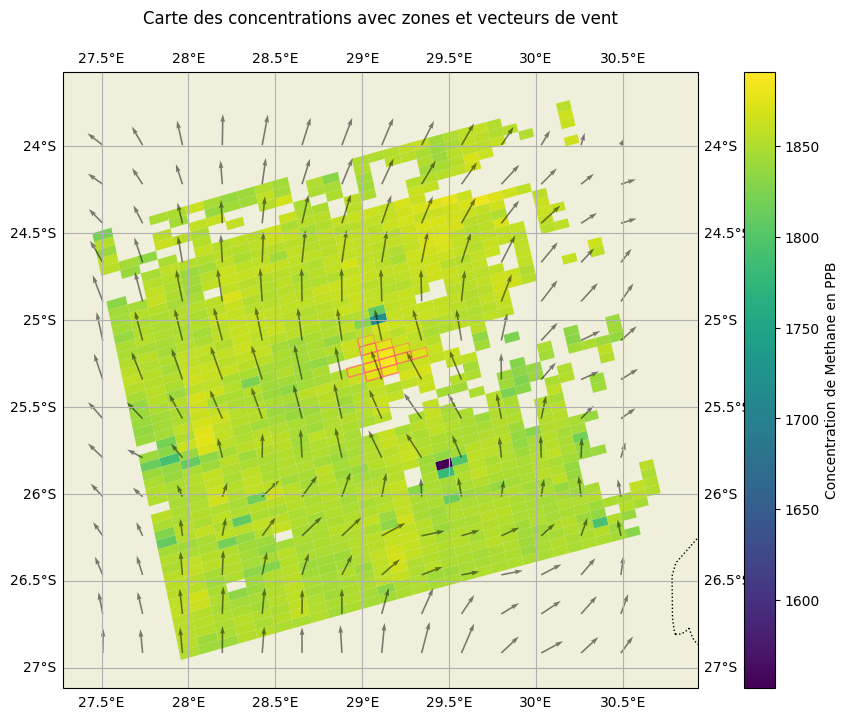

emissions totales= 32.30100434416048 tonnes par heures
latlon= (-25.27, 29.06)


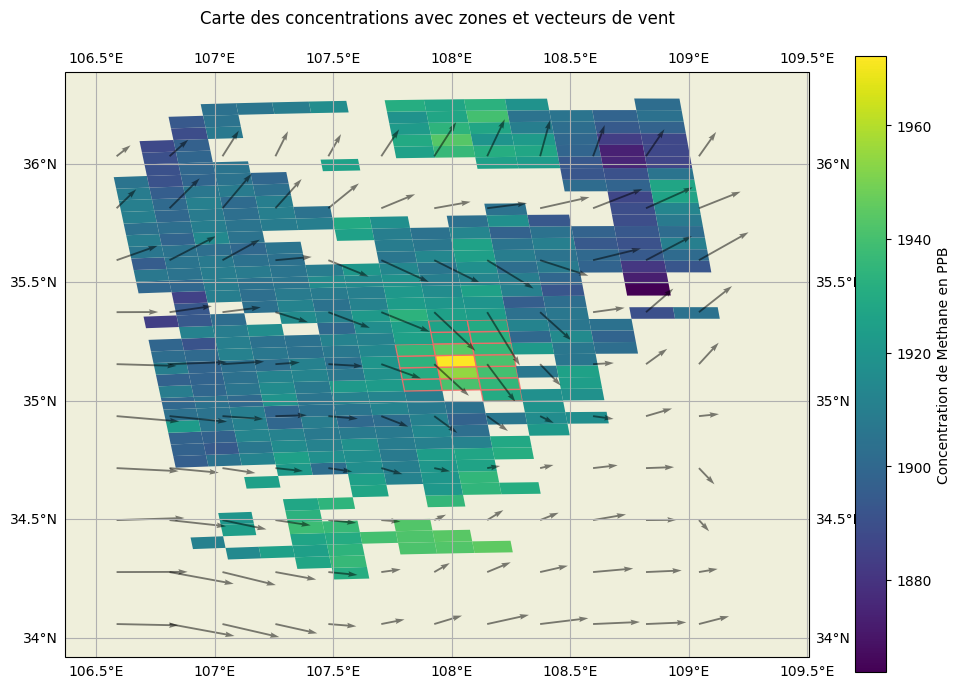

emissions totales= 30.953273513734082 tonnes par heures
latlon= (35.12, 107.86)


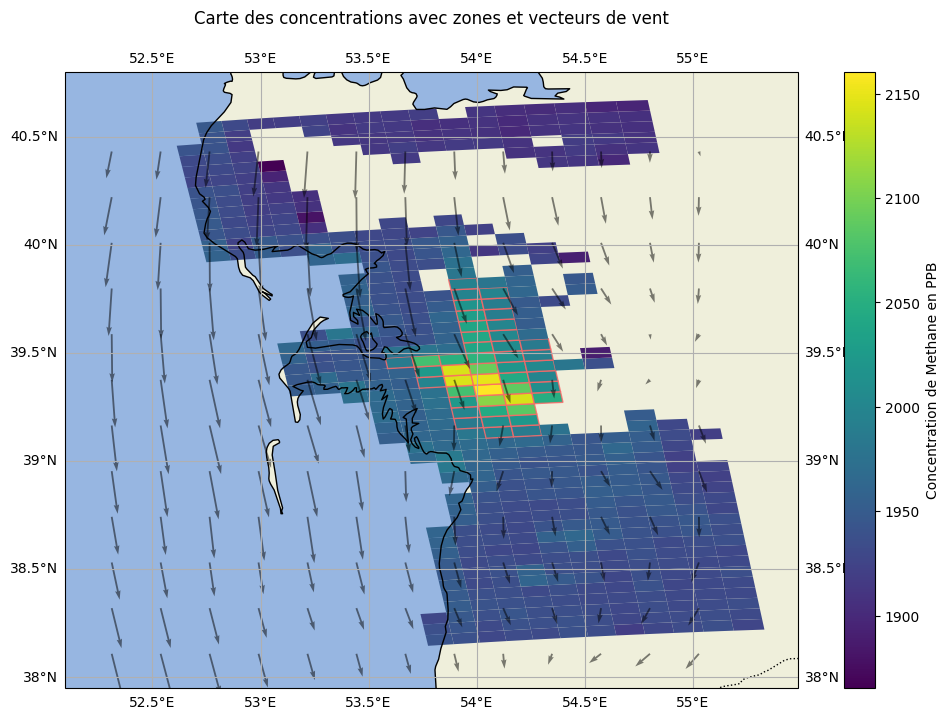

emissions totales= 446.5294304862638 tonnes par heures
latlon= (39.46, 53.77)


In [1]:
import sys
import math
import matplotlib.pyplot as plt
from scipy import ndimage
from math import radians, cos, sin, asin, sqrt
from matplotlib.backends.backend_pdf import PdfPages
from datetime import datetime
import ee
import pickle
import numpy as np
from matplotlib.animation import FuncAnimation
import requests  
from io import BytesIO
import csv
from PIL import Image
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.patches import Polygon
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

"""
##############################################################################################################################################
PARAMS
##############################################################################################################################################
"""
np.set_printoptions(threshold=sys.maxsize)
sdstep=1                                      ## admitted mean deviation ( in standard deviations ) for a concentration to be considered in the plume
file_in = './example_data_v2.pkl'               ##### File name containing example data


"""
##############################################################################################################################################
DATA READING FUNCTIONS 
#############################################################################################################################################
"""

def plot_concentration_map(map_data):
    fig, ax = plt.subplots(subplot_kw={'projection': ccrs.PlateCarree()},figsize=(12, 8))
    [X, Y, ewwind, nswind] = generatewindmap(map_data)
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.gridlines(draw_labels=True)
    conc = map_data['conc']
    lat = map_data['lat']
    lon = map_data['lon']
    mask = map_data['mask']
    lat0 = map_data['lat0']
    lat1 = map_data['lat1']
    lat2 = map_data['lat2']
    lat3 = map_data['lat3']
    lon0 = map_data['lon0']
    lon1 = map_data['lon1']
    lon2 = map_data['lon2']
    lon3 = map_data['lon3']
    cmap = plt.get_cmap('viridis')
    vmin=np.inf
    vmax=0
    for i in range(len(lat0)):
        if not np.isnan(conc[i]):
            if conc[i]>vmax:
                vmax=conc[i]
            if conc[i]<vmin:
                vmin=conc[i]
    norm = Normalize(vmin=vmin, vmax=vmax)
    for i in range(len(lat0)):
        if mask[i]==0:
            polygon_coords = [(lon0[i], lat0[i]), (lon1[i], lat1[i]), (lon2[i], lat2[i]), (lon3[i], lat3[i])]
            color = cmap(norm(conc[i]))
            polygon = Polygon(polygon_coords, closed=True, edgecolor='none', facecolor=color, transform=ccrs.PlateCarree())
            ax.add_patch(polygon)
        else:
            polygon_coords = [(lon0[i], lat0[i]), (lon1[i], lat1[i]), (lon2[i], lat2[i]), (lon3[i], lat3[i])]
            color = cmap(norm(conc[i]))
            polygon = Polygon(polygon_coords, closed=True, edgecolor=(1, 0.4, 0.4, 0.8), facecolor=color, transform=ccrs.PlateCarree())
            ax.add_patch(polygon)
    plt.colorbar(ScalarMappable(norm=norm, cmap=cmap), ax=ax, orientation='vertical', label='Concentration de Methane en PPB')
    ax.quiver(X, Y, ewwind, nswind, transform=ccrs.PlateCarree(), color=(0, 0, 0, 0.5),width=0.0025)
    plt.title('Carte des concentrations avec zones et vecteurs de vent',pad=20)
    plt.show()



def plot_matrix_scatter(matrix):
    # Convert the matrix to a numpy array
    matrix = np.array(matrix)
    # Get the coordinates of the ones in the matrix
    ones_positions = np.argwhere(matrix == 1)
    # Split the coordinates into x and y components
    x, y = ones_positions[:, 1], ones_positions[:, 0]
    # Create the scatter plot
    plt.scatter(x, y, c='blue', marker='s')
    plt.gca().invert_yaxis()  # Invert y-axis to match matrix row/column indexing
    plt.xlabel('Column Index')
    plt.ylabel('Row Index')
    plt.title('Scatter Plot of Matrix')
    plt.grid(True)
    plt.show()


def addminmax(map):
   minlat=float(min(map['lat']))
   maxlon=float(max(map['lon']))
   minlon=float(min(map['lon']))
   maxlat=float(max(map['lat']))
   map['extr']=[minlat,maxlon,minlon,maxlat]

def read_pickle(nnn):
   objects = []
   with (open(nnn, "rb")) as openfile:
      while True:
         try:
            objects.append(pickle.load(openfile))
         except EOFError:
            break
   return objects


"""
##############################################################################################################################################
PLUME RELATED ALGORITHMS
#############################################################################################################################################
"""


def findplumesource2(map):     
    '''
    returns the x and y location of a plume source from the latitude and longitude of the source 
    '''
    lat,lon=map['latlon']
    mindist=np.inf
    N=len(map['conc'])
    for i in range(N):
        idist=haversine(lat,lon,map['lat'][i],map['lon'][i])
        if idist<mindist:
            mindist=idist
            Ind=i
    return(map['xloc'][Ind],map['yloc'][Ind])


def findplumesource(map):     
    '''
    returns the x and y location of a plume source from the latitude and longitude of the source 
    '''
    lat,lon=map['latlon']
    maxdist=0
    N=len(map['conc'])
    for i in range(N):
        idist=haversine(lat,lon,map['lat'][i],map['lon'][i])
        if idist>maxdist:
            maxdist=idist
    dist=maxdist/20
    maxconc=0
    for i in range(N):
        idist=haversine(lat,lon,map['lat'][i],map['lon'][i])
        if idist<maxdist:
            if map['conc'][i]>maxconc:
                maxconc=map['conc'][i]
                Ind=i
    return(map['xloc'][Ind],map['yloc'][Ind])


def addplume(map,xloc,yloc,threshold):    
   """
    adds the plume to the dictionnary with a proximity algorithm
   """
   N=len(map['conc'])
   miny=min(map['yloc'])
   maxy=max(map['yloc'])
   minx=min(map['xloc'])
   maxx=max(map['xloc'])
   I=maxy-miny+1             
   J=maxx-minx+1
   map['mask']=np.zeros(N,dtype=int)
   npmap=np.zeros((I,J))

   for i in range(N):
      npmap[map['yloc'][i]-miny][map['xloc'][i]-minx]=map['conc'][i]
   plumematrix=np.zeros((I,J))
   plumematrix[yloc-miny][xloc-minx]=1
   Exitcondition=False

   while not Exitcondition:
      Ni=np.count_nonzero(plumematrix == 1)
      plumematrix=ndimage.binary_dilation(plumematrix).astype(plumematrix.dtype)
      for i in range(I):
         for j in range(J):
            if plumematrix[i][j]==1:
               if np.isnan(npmap[i][j]):
                  plumematrix[i][j]=0
               else:
                  if npmap[i][j]<threshold:
                     plumematrix[i][j]=0
      #plot_matrix_scatter(plumematrix)
                  
      Nj=np.count_nonzero(plumematrix == 1)
      if Ni==Nj:
         Exitcondition=True
   for i in range(N):
      if plumematrix[map['yloc'][i]-miny][map['xloc'][i]-minx]==1:
         map['mask'][i]=1
def haversine(lat1, lon1, lat2, lon2):
    """
    calculates the distance between two points from their coordinates in meters
    """
    lon1 = math.radians(lon1)        
    lat1 = math.radians(lat1)
    lon2 = math.radians(lon2)
    lat2 = math.radians(lat2)
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2    
    c = 2 * asin(sqrt(a)) 
    r = 6371000 
    return c * r



"""
##############################################################################################################################################
EMISSIONS RELATED ALGORITHMS
#############################################################################################################################################
"""


def calc_area(map,i):
    '''
    returns area of a rectangle on the map in sqmeters
    '''
    d1=haversine(map['lat0'][i],map['lon0'][i],map['lat1'][i],map['lon1'][i])     
    d2=haversine(map['lat1'][i],map['lon1'][i],map['lat2'][i],map['lon2'][i])   
    #print("(mètres) d1=",d1,"d2=",d2)
    return d1*d2


def calc_mass(cppb,press,area):
    #print(cppb,press,area)
    '''
    calculates the mass of methane in a given area in kgs
    '''
    airmass=(press/9.81)*area
    nmolecules=(airmass/0.0289)    
    nCh4=cppb*nmolecules/1000000000         
    mCh4=nCh4*0.01604               
    return mCh4
    

def gettruemean(map):
    """
    returns the mean ch4 ppb outside the plume anomaly
    """
    N=len(map['conc'])
    Nconcval=0
    truemean=0                      
    for i in range(N):
          if not np.isnan(map['conc'][i]):
              if map['mask'][i]==0:                  #the pixel is outside the plume 
                  truemean=truemean+map['conc'][i]
                  Nconcval=Nconcval+1
    truemean=truemean/Nconcval
    return truemean


def calc_emissions(map):
    '''
    Calculates the total emissions of a plume in kg.s-1 with ime method
    '''
    N=len(map['conc'])
    IME=0
    total_area=0

    NS_Wind = np.load('NS_Wind.npy')
    EW_Wind = np.load('EW_Wind.npy')
    I,J=np.shape(NS_Wind)[0],np.shape(NS_Wind)[1]
    speeds=0
    for i in range(I):
        for j in range(J):
            speeds=speeds+np.sqrt(NS_Wind[i][j]**2+EW_Wind[i][j]**2)
    windspeed=speeds/(I*J)
    #print("mean windspeed=",windspeed)
    truemean=gettruemean(map)
    #print("mean methane ppb outside the plume=",truemean)
    
    for i in range(N):
        if map['mask'][i]==1:
            area=calc_area(map,i)
            total_area=total_area+area
            IME=IME+calc_mass(map['conc'][i]-truemean ,map['sp'][i],area)  
    IME=IME/np.sqrt(total_area)
    IME=IME*windspeed
    return(IME)

def getthreshold(map):
    
    """Calculates the Ch4 ppb threshold for a pixel to belong in the plume based on 
    the number of admitted standard deviations"""

    N=len(map['conc'])
    Nconcval=0
    mean=0                      #Mean Ch4 value in the area
    for i in range(N):
          if not np.isnan(map['conc'][i]):
             mean=mean+map['conc'][i]
             Nconcval=Nconcval+1
    mean=mean/Nconcval
    sd=0                        #Standard deviation of methane concentrations in the area
    for i in range(N):      
       if not np.isnan(map['conc'][i]):
          sd=sd+(map['conc'][i]-mean)**2
    sd=sd/Nconcval
    sd=np.sqrt(sd)
    threshold=mean+sd*sdstep
    return threshold



"""
##############################################################################################################################################
WIND DATA RELATED FUNCTIONS
#############################################################################################################################################
"""


def generatewindmap(map):
   addminmax(map)
   date=map['date']
   minlat,maxlon,minlon,maxlat=map['extr']
   return (generatewindtable(float(minlon),float(minlat),float(maxlon),float(maxlat),date))
    

def generatewindtable( minlong ,minlat ,maxlong ,maxlat,date):
    date_str = str(date)
    date = f"{date_str[:4]}-{date_str[4:6]}-{date_str[6:8]}"
    dataset="NASA/GEOS-CF/v1/rpl/tavg1hr"
    ee.Initialize()
    roi = ee.Geometry.Rectangle([minlong,minlat ,maxlong , maxlat ])
    dataset = ee.ImageCollection(dataset) \
              .filterBounds(roi) \
              .filterDate(date)  \
              .sort('system:time_start') \
              .select(['U10M','V10M'])
    datalist = dataset.toList(dataset.size().getInfo())
    nimages = datalist.size().getInfo()
    tablesList=[]
    for i in range(nimages):                              #work in progress- used to animate the wind progression for the previous images 
        image = ee.Image(datalist.get(i))
        band_arrs = image.sampleRectangle(region=roi,defaultValue=0) 
        EW_data_table = np.array( band_arrs.get('U10M').getInfo() ) 
        NS_data_table = np.array( band_arrs.get('V10M').getInfo() ) 
        date_milliseconds = image.date().getInfo()['value']
        tablesList.append({"EW_Wind":EW_data_table,"date":date_milliseconds,"NS_Wind":NS_data_table})          
    nLat=len(tablesList[0]['EW_Wind'])
    nLong=len(tablesList[0]['EW_Wind'][0])
    latstep= (maxlat-minlat)/nLat
    longstep=(maxlong-minlong)/nLong
    X = np.arange(minlong, maxlong,longstep)
    Y = np.arange(minlat,maxlat,latstep)
    X, Y = np.meshgrid(X, Y)
    tablesList[0]['EW_Wind']=np.array(tablesList[0]['EW_Wind'])
    tablesList[0]['NS_Wind']=np.array(tablesList[0]['NS_Wind'])
    np.save('EW_Wind.npy',tablesList[0]['EW_Wind'])
    np.save('NS_Wind.npy',tablesList[0]['NS_Wind'])
    np.save('Longitudes.npy',X)
    np.save('Lattitudes.npy',X)
    return(X, Y, tablesList[0]['EW_Wind'], tablesList[0]['NS_Wind'])


objs = read_pickle(file_in)                     ##### read the file with example data
nobjs = len(objs)                               ## Number of objects
emissions=[]
for io in range(nobjs): #remplacer 5 par nobjs
    map=objs[io]
    xloc,yloc=findplumesource2(map)
    threshold=getthreshold(map)
    addplume(map,xloc,yloc,threshold)
    plot_concentration_map(map)
    emissions.append(calc_emissions(map)*3.6)
    print("emissions totales=",calc_emissions(map)*3.6,"tonnes par heures")
    print("latlon=",map['latlon'])



def extraire_colonne_csv(nom_fichier):
    valeurs_colonne = []
    with open(nom_fichier, "r") as fichier_csv:
        lecteur_csv = csv.reader(fichier_csv)
        en_tete = next(lecteur_csv)  # Ignorer la première ligne (en-tête)
        index_colonne = en_tete.index("source_rate_t/h")
        for ligne in lecteur_csv:
            valeurs_colonne.append(float(ligne[index_colonne]))  # Convertir en nombre si nécessaire
    return valeurs_colonne

nom_fichier_csv = "sron_data.csv"
valeurs_source_rate = extraire_colonne_csv(nom_fichier_csv)



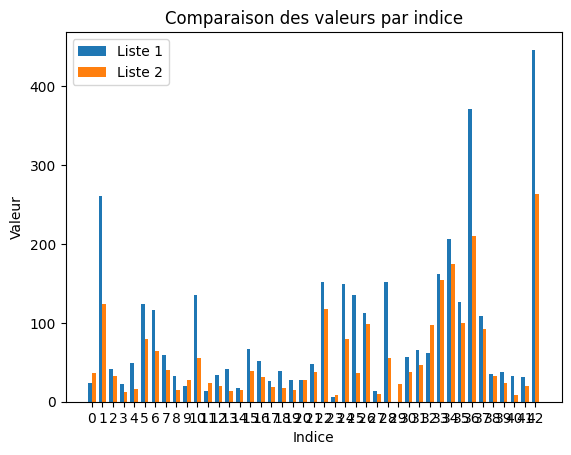